<a href="https://colab.research.google.com/github/gm-spacagna/deep-picture-embedding-features/blob/main/Extracting_features_from_social_media_pictures.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [23]:
! pip install --upgrade pip
! pip install torch torchvision torchsummary gca pandas numpy matplotlib seaborn sklearn>=0.22 pycocotools tqdm
# pip install git+https://github.com/waleedka/cocoapi.git#egg=pycocotools&subdirectory=PythonAPI
! pip list

Requirement already up-to-date: pip in /usr/local/lib/python3.6/dist-packages (20.2.4)
Package                          Version
-------------------------------- --------------------
absl-py                          0.7.1
astor                            0.8.0
attrs                            19.1.0
backcall                         0.1.0
bleach                           3.1.0
certifi                          2019.6.16
chainer                          6.2.0
chardet                          3.0.4
cloudpickle                      1.2.1
cntk-gpu                         2.7
contextlib2                      0.5.5
cupy                             6.2.0
cycler                           0.10.0
Cython                           0.29.13
decorator                        4.4.0
defusedxml                       0.6.0
dm-sonnet                        1.34
entrypoints                      0.3
enum34                           1.1.6
fastrlock                        0.4
filelock                         3.0.

Choose a GPU runtime

In [3]:
import torch
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
if torch.cuda.is_available():
    print(torch.cuda.current_device())
    print(torch.cuda.device_count())
    print(torch.cuda.get_device_name(0))
    
device

0
1
Quadro P5000


device(type='cuda', index=0)

In [4]:
# Load the ResNext-WSL model

# small size model
model = torch.hub.load('facebookresearch/WSL-Images', 'resnext101_32x8d_wsl')
# medium size
# model = torch.hub.load('facebookresearch/WSL-Images', 'resnext101_32x16d_wsl')
# large size
# model = torch.hub.load('facebookresearch/WSL-Images', 'resnext101_32x32d_wsl')
# very large
# model = torch.hub.load('facebookresearch/WSL-Images', 'resnext101_32x48d_wsl')
# model.eval()

Using cache found in /root/.cache/torch/hub/facebookresearch_WSL-Images_master


In [5]:
from torch import nn
from torchsummary import summary

# Dropping output layer (the ImageNet classifier)

def slice_model(original_model, from_layer=None, to_layer=None):
    return nn.Sequential(*list(original_model.children())[from_layer:to_layer])
model_conv_features = slice_model(model, to_layer=-1).to(device)
summary(model_conv_features, input_size=(3,224,224))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 112, 112]           9,408
       BatchNorm2d-2         [-1, 64, 112, 112]             128
              ReLU-3         [-1, 64, 112, 112]               0
         MaxPool2d-4           [-1, 64, 56, 56]               0
            Conv2d-5          [-1, 256, 56, 56]          16,384
       BatchNorm2d-6          [-1, 256, 56, 56]             512
              ReLU-7          [-1, 256, 56, 56]               0
            Conv2d-8          [-1, 256, 56, 56]          18,432
       BatchNorm2d-9          [-1, 256, 56, 56]             512
             ReLU-10          [-1, 256, 56, 56]               0
           Conv2d-11          [-1, 256, 56, 56]          65,536
      BatchNorm2d-12          [-1, 256, 56, 56]             512
           Conv2d-13          [-1, 256, 56, 56]          16,384
      BatchNorm2d-14          [-1, 256,

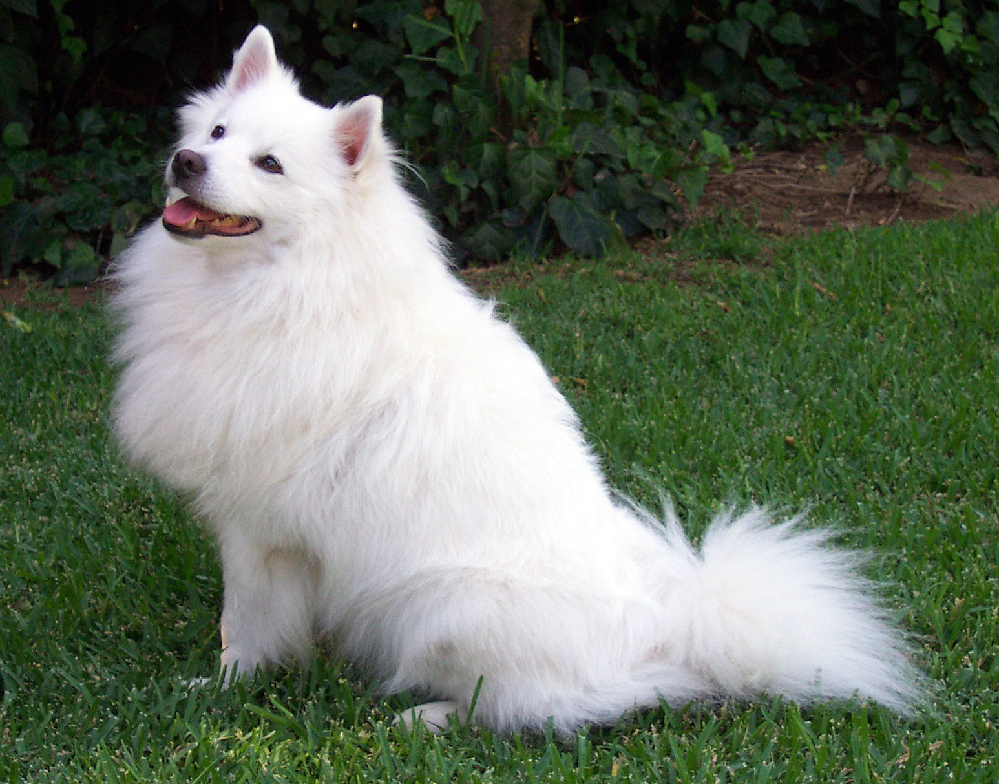

In [6]:
# Test the model works with a sample dog picture
import urllib
url, filename = ("https://github.com/pytorch/hub/raw/master/images/dog.jpg", "dog.jpg")
try: urllib.URLopener().retrieve(url, filename)
except: urllib.request.urlretrieve(url, filename)

from PIL import Image
input_image = Image.open(filename)
input_image

In [7]:
from PIL import Image
from torchvision import transforms
# pre-processing required by ResNext
preprocess = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])
input_tensor = preprocess(input_image)

In [8]:
from matplotlib import pyplot as plt
import numpy as np
# Plotting the preprocessed picture, the range of values now fall outside the [0..1] RGB valid range
plt.imshow(np.moveaxis(input_tensor.numpy(), 0,-1 ))
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


<Figure size 640x480 with 1 Axes>

shape torch.Size([1, 2048])


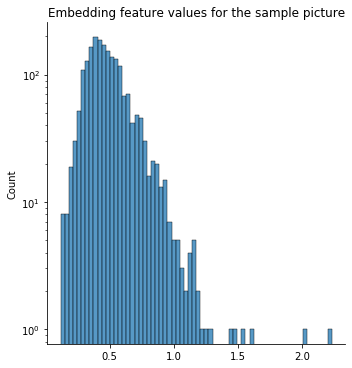

In [9]:
input_batch = torch.stack([input_tensor])

input_batch = input_batch.to(device)

# applying the model to the pre-processed picture and extracting the 2048 ResNext features
with torch.no_grad():
    output = model_conv_features(input_batch).flatten(start_dim=1)
print('shape', output.shape)

import seaborn as sns
sns.displot(output[0].cpu().numpy())
# plt.xscale('log')
plt.yscale('log')
plt.title('Embedding feature values for the sample picture')
plt.show()

# Download the COCO dataset

In [12]:
! wget http://images.cocodataset.org/zips/val2017.zip
! wget http://images.cocodataset.org/annotations/annotations_trainval2017.zip
! mkdir -p data
! unzip -q val2017.zip -d data
! unzip -q annotations_trainval2017.zip -d data

# Load and explore Coco data

In [54]:
import pycocotools
import torchvision.datasets as dset
import os
cwd = os.getcwd() 
data_dir = os.path.join(cwd, 'data')
root= os.path.join(data_dir, 'val2017')
annFile=os.path.join(data_dir, 'annotations', 'instances_val2017.json')
coco_val = dset.CocoDetection(root = root,
                              annFile = annFile, transform = preprocess)

loading annotations into memory...
Done (t=0.73s)
creating index...
index created!


In [17]:
# 5000 pictures with associated labels
len(coco_val)

5000

In [18]:
X, y = coco_val[0]

In [19]:
X.shape

torch.Size([3, 224, 224])

In [20]:
# annotation format
y[0].keys()

dict_keys(['segmentation', 'area', 'iscrowd', 'image_id', 'bbox', 'category_id', 'id'])

In [83]:
# Load the taxonomy of categories

from pycocotools.coco import COCO

data_type='val2017'
ann_file='{}/annotations/instances_{}.json'.format(data_dir,data_type)
coco=COCO(ann_file)

cats = coco.loadCats(coco.getCatIds())

category_names =[cat['name'] for cat in cats]
print('COCO categories {}: \n{}\n'.format(len(category_names), ' '.join(category_names)))
supercategory_names = set([cat['supercategory'] for cat in cats])
print('COCO supercategories {}: \n{}'.format(len(supercategory_names), ' '.join(supercategory_names)))

loading annotations into memory...
Done (t=0.40s)
creating index...
index created!
COCO categories 80: 
person bicycle car motorcycle airplane bus train truck boat traffic light fire hydrant stop sign parking meter bench bird cat dog horse sheep cow elephant bear zebra giraffe backpack umbrella handbag tie suitcase frisbee skis snowboard sports ball kite baseball bat baseball glove skateboard surfboard tennis racket bottle wine glass cup fork knife spoon bowl banana apple sandwich orange broccoli carrot hot dog pizza donut cake chair couch potted plant bed dining table toilet tv laptop mouse remote keyboard cell phone microwave oven toaster sink refrigerator book clock vase scissors teddy bear hair drier toothbrush

COCO supercategories 12: 
animal food outdoor furniture indoor vehicle accessory appliance person kitchen sports electronic


In [93]:
cat_id_to_name_dict = {cat['id']: cat['name'] for cat in cats}
cat_id_to_supercategory_name = {cat['id']: cat['supercategory'] for cat in cats}

annotation categories in the picture ['person', 'person', 'handbag', 'bicycle']


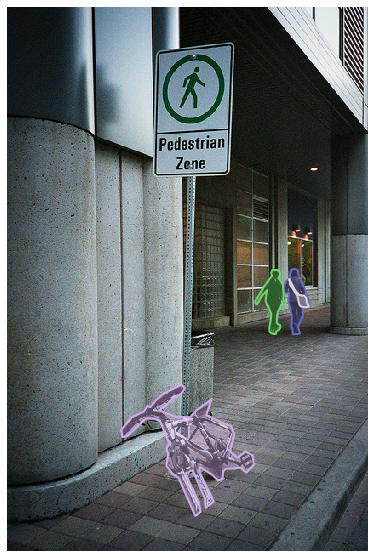

In [81]:
# load and display instance annotations

import skimage.io as io
import matplotlib.pyplot as plt
import pylab

# imgIds = coco.getImgIds(imgIds = [72852, 478474, 108440, 129054])
img_id = 72852
img = coco.loadImgs(img_id)[0]
I = io.imread(img['coco_url'])

plt.imshow(I)
plt.axis('off')

# catIds = coco.getCatIds(catNms=['person','dog','skateboard']);
annIds = coco.getAnnIds(imgIds=img['id'], iscrowd=None)
anns = coco.loadAnns(annIds)
coco.showAnns(anns)
print('annotation categories in the picture', [cat_id_to_name_dict[ann['category_id']] for ann in anns])

# Load Coco Data using the [torchvision API](https://pytorch.org/docs/stable/torchvision/datasets.html)

In [21]:
from torch.utils.data import DataLoader
import multiprocessing

cpu_count = multiprocessing.cpu_count()
print('cpus', cpu_count)
batch_size = 64

data_loader = torch.utils.data.DataLoader(dataset=coco_val, 
                                          batch_size=batch_size,
                                          shuffle=False,
                                          num_workers=cpu_count,
                                          collate_fn=lambda x: x)

cpus 8


In [26]:
from tqdm import tqdm
features_list = []
labels_list = []

# Use GPUs to speed up the inference, this should take around 1 minute

model_conv_features.to(device)
for batch in tqdm(data_loader):
    image_batch, label_batch = [x[0] for x in batch], [x[1] for x in batch]
    image_batch = torch.stack(image_batch).to(device) 

    with torch.no_grad():
        features_batch = model_conv_features(image_batch).flatten(start_dim=1)
    features_list.append(features_batch)
    labels_list.extend(label_batch)
        
        

100%|██████████| 79/79 [00:49<00:00,  1.59it/s]


In [27]:
# concat features
features  = torch.cat(features_list)
features.shape


torch.Size([5000, 2048])

In [155]:
torch.save(features, os.path.join(data_dir, "features_val.pt"))

In [147]:
# extract and concat labels, None in case of multiple labels
from collections import Counter
category_labels=[]
supercategory_labels = []
image_ids = []

for label in labels_list:
    
    if len(label) > 0:
        categories = []
        supercategories = []
        
        for annotation in label:
            categories.append(coco_val.coco.cats[annotation['category_id']]['name'])
            supercategories.append(coco_val.coco.cats[annotation['category_id']]['supercategory'])
        
        # most common category among objects in the picture
        category, _ = Counter(categories).most_common(1)[0]
        supercategory, _ = Counter(supercategories).most_common(1)[0]
        
        image_ids.append(label[0]['image_id'])
        category_labels.append(category)
        supercategory_labels.append(supercategory)
    else:
        category_labels.append(None)
        supercategory_labels.append(None)
        image_ids.append(None)
        
len(category_labels), len(supercategory_labels), len(image_ids)

(5000, 5000, 5000)

In [100]:
Counter(category_labels).most_common(10)

[('person', 1564),
 ('car', 241),
 ('chair', 156),
 ('bottle', 129),
 ('cat', 115),
 ('book', 111),
 ('dog', 109),
 ('bird', 88),
 ('toilet', 85),
 ('giraffe', 82)]

In [99]:
Counter(supercategory_labels).most_common(10)

[('person', 1403),
 ('animal', 735),
 ('vehicle', 614),
 ('kitchen', 408),
 ('furniture', 407),
 ('food', 338),
 ('indoor', 295),
 ('electronic', 192),
 ('outdoor', 176),
 ('sports', 160)]

In [102]:
print("Number of COCO categories in the data", len(set(category_labels)), len(set(supercategory_labels)))

Number of COCO categories in the data 81 13


# 3D visualization

In [103]:
import numpy as np
from sklearn.manifold import TSNE

X = features.to("cpu").numpy()


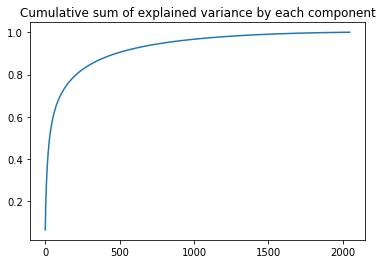

In [45]:
# Extracting all of the principal components 

from sklearn.decomposition import PCA
pca = PCA(X.shape[1])
X_pca = pca.fit_transform(X)
plt.plot(range(X.shape[1]), np.cumsum(pca.explained_variance_ratio_))
plt.title('Cumulative sum of explained variance by each component')
plt.show()

In [46]:
# Reducing the dimensionality to 3
from sklearn.manifold import TSNE

X_tsne = TSNE(n_components=3, verbose=1,random_state=46, 
              perplexity=40, n_iter=300).fit_transform(X_pca[:, :1000])
X_tsne.shape

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 5000 samples in 0.211s...
[t-SNE] Computed neighbors for 5000 samples in 45.896s...
[t-SNE] Computed conditional probabilities for sample 1000 / 5000
[t-SNE] Computed conditional probabilities for sample 2000 / 5000
[t-SNE] Computed conditional probabilities for sample 3000 / 5000
[t-SNE] Computed conditional probabilities for sample 4000 / 5000
[t-SNE] Computed conditional probabilities for sample 5000 / 5000
[t-SNE] Mean sigma: 9.465238
[t-SNE] KL divergence after 250 iterations with early exaggeration: 74.859146
[t-SNE] KL divergence after 300 iterations: 1.501660


(5000, 3)

In [116]:
import pandas as pd
def print_3d(X_tsne, labels, title=None, columns=['x0', 'x1', 'x2']):
    import matplotlib.pyplot as plt
    from mpl_toolkits.mplot3d import Axes3D
    df = pd.DataFrame(X_tsne, columns=columns)
    df['label'] = labels
    cmap = plt.get_cmap('gist_rainbow')
    unique_labels = list(set(labels))
    labels_dict = {label: i for i, label in enumerate(unique_labels)}
    num_colors = len(unique_labels)
    c = [cmap(1.*labels_dict[label]/num_colors) for label in labels]

    df['c'] = c
    df = df[~df['label'].isna()]
    ax = plt.figure(figsize=(16,10)).gca(projection='3d')
    
    for label, grp in df.groupby('label'):
        ax.scatter(
        xs=grp[columns[0]], 
        ys=grp[columns[1]], 
        zs=grp[columns[2]], 
        c=grp['c'], 
        alpha=0.2,
        label=label
    #     cmap='gist_rainbow'
    )
    
    ax.set_xlabel(columns[0])
    ax.set_ylabel(columns[1])
    ax.set_zlabel(columns[2])
    
    plt.legend(loc='best')
    if title:
        plt.title(title)
    plt.show()


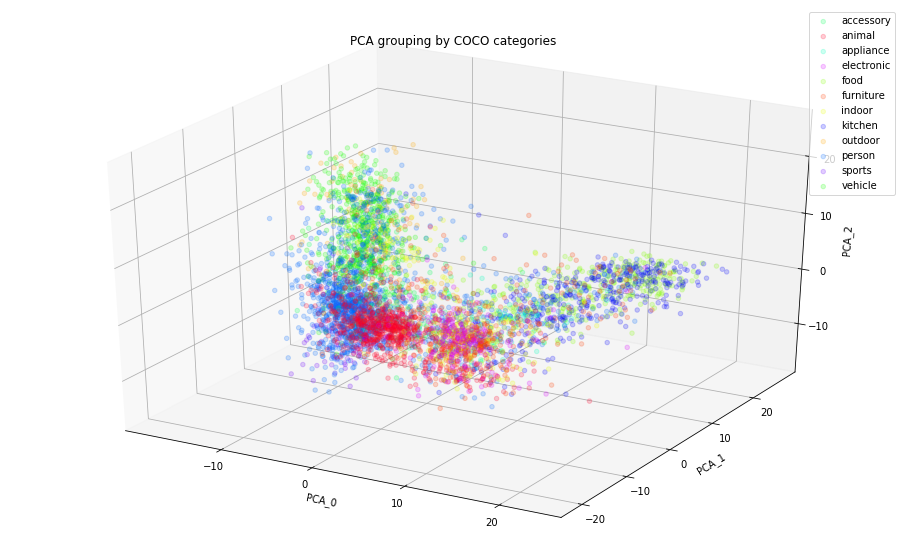

In [117]:
print_3d(X_pca[:, :3], supercategory_labels, 'PCA grouping by COCO categories', columns=['PCA_0', 'PCA_1', 'PCA_2'])

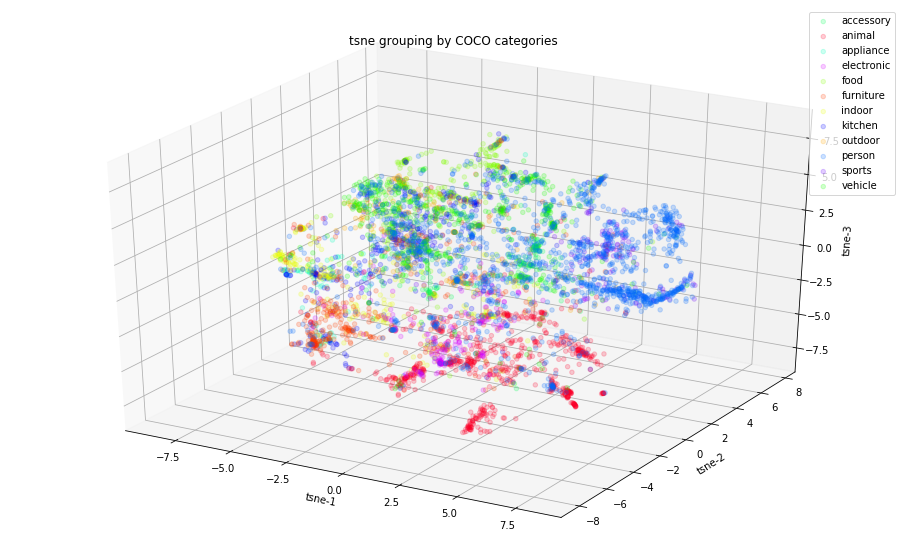

In [118]:
print_3d(X_tsne, supercategory_labels, 'tsne grouping by COCO categories', columns=['tsne-1', 'tsne-2', 'tsne-3'])

# Interactive exploration in Tensorboard

In [85]:
# Tensorboard
# TODO: add code for generating and running the tensorboard

In [123]:
import os
import shutil
from tensorboard.plugins import projector
import tensorflow.compat.v1 as tf

In [124]:
features.shape

torch.Size([5000, 2048])

In [126]:
os.path.join(data_dir, "tensorboard_log")

'/notebooks/data/tensorboard_log'

In [152]:
metadata = [f'{img_id}: {supercategory}' for img_id, supercategory in zip(image_ids, supercategory_labels)]
metadata[:10]

['139: furniture',
 '285: animal',
 '632: indoor',
 '724: outdoor',
 '776: indoor',
 '785: person',
 '802: appliance',
 '872: sports',
 '885: person',
 '1000: person']

In [153]:
def store_embedding_matrix(embedding_matrix, embedding_matrix_metadata, 
                           name, 
                           log_folder=os.path.join(data_dir, "tensorboard_log"),
                           metadata_path="metadata.txt"):
    log_folder = f"{log_folder}"
    tf.disable_v2_behavior()
    if os.path.exists(log_folder):
        shutil.rmtree(log_folder)
    os.makedirs(log_folder)
    print(f"Store metadata for tensorboard")
    with open(os.path.join(log_folder, metadata_path), mode="wb") as metadata_f:
        for metadata in embedding_matrix_metadata:
            metadata_f.write(metadata.encode('utf-8') + b"\n")
    print(f"Building fake tf graph")
    embedding_tensor = tf.Variable(embedding_matrix, name=name, dtype=tf.float32)
    config = projector.ProjectorConfig()
    tensor_config = config.embeddings.add()
    tensor_config.tensor_name = embedding_tensor.name
    tensor_config.metadata_path = metadata_path
    print(f"Write summaries")
    summary_writer = tf.summary.FileWriter(log_folder)
    projector.visualize_embeddings(summary_writer, config)
    print(f"Run fake tf graph")
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        saver = tf.train.Saver(save_relative_paths=True)
        saver.save(sess, os.path.join(log_folder, "checkpoint.ckpt"))

In [156]:
log_folder = os.path.join(data_dir, "tensorboard_log")
store_embedding_matrix(embedding_matrix = X, log_folder=log_folder, embedding_matrix_metadata=metadata, name='resnext-features')

W1122 10:28:01.722126 139844881028928 deprecation.py:323] From /usr/local/lib/python3.6/dist-packages/tensorflow_core/python/compat/v2_compat.py:68: disable_resource_variables (from tensorflow.python.ops.variable_scope) is deprecated and will be removed in a future version.
Instructions for updating:
non-resource variables are not supported in the long term


Store metadata for tensorboard
Building fake tf graph
Write summaries
Run fake tf graph


 Run from the terminal ```curl -o - icanhazip.com``` to print your IP address and then
 
 ```tensorboard --logdir=data/tensorboard_log --port 6006``` to run the tensorboard

In [163]:
%load_ext tensorboard
%tensorboard --logdir {log_folder} --host 0.0.0.0

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


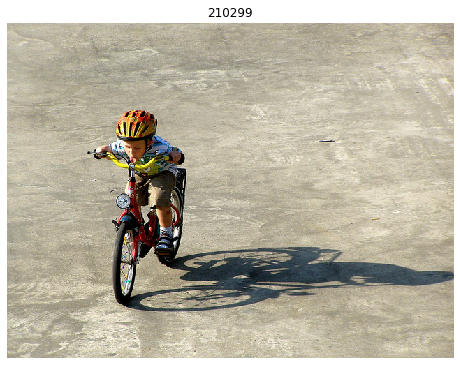

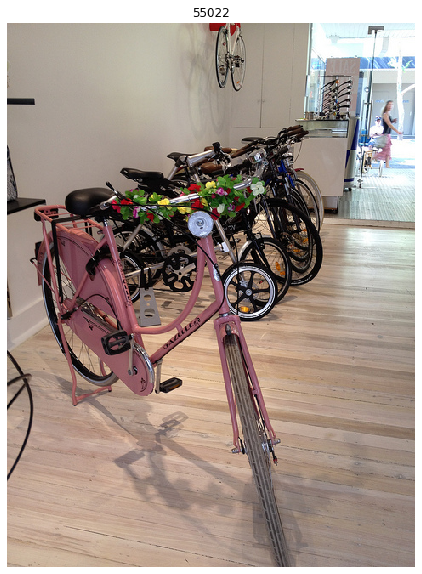

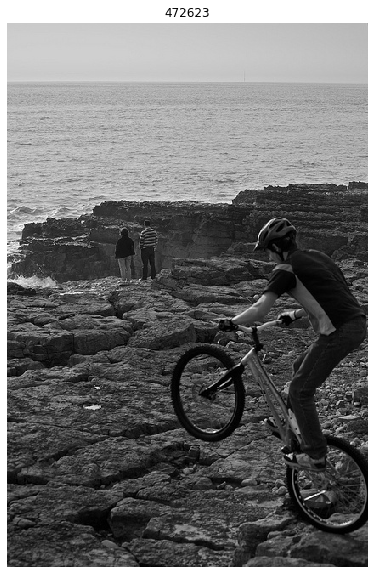

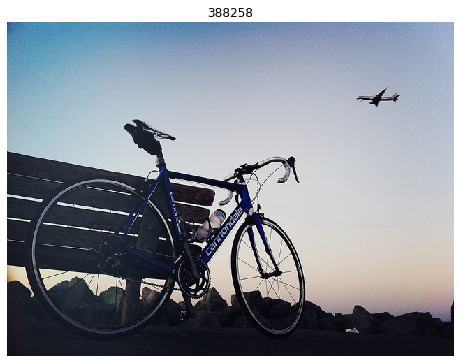

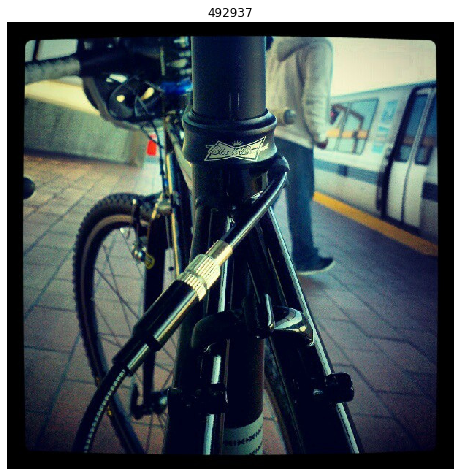

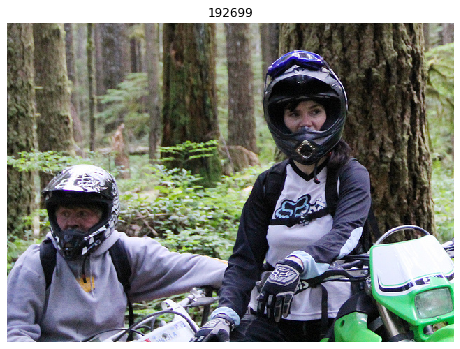

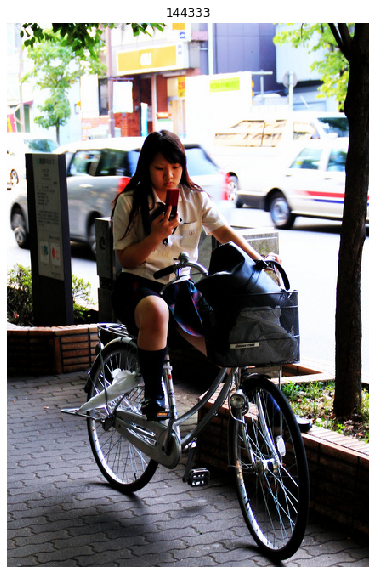

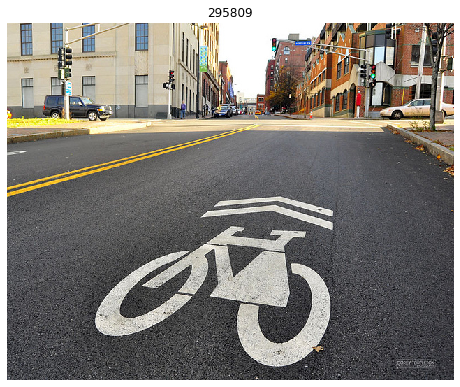

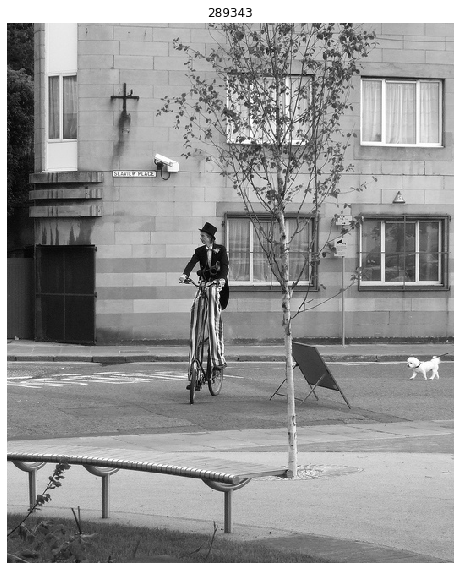

In [119]:

pylab.rcParams['figure.figsize'] = (8.0, 10.0)

# a few pictures manually picked from the "bicycle" cluster identified form the tensorboard
imgIds =[210299, 55022, 472623, 388258, 492937, 192699, 144333, 295809, 289343]

for imgId in imgIds:
    img = coco.loadImgs(imgId)[0]
    I = io.imread(img['coco_url'])
    plt.axis('off')
    plt.imshow(I)
    plt.title(str(imgId))
    plt.show()

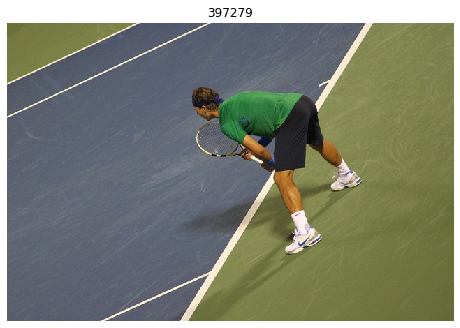

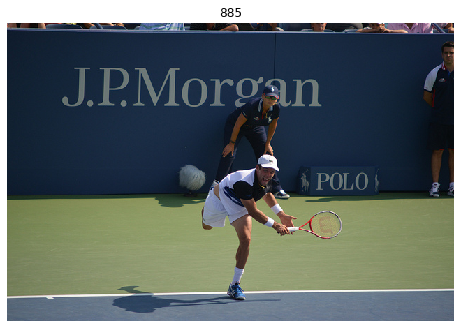

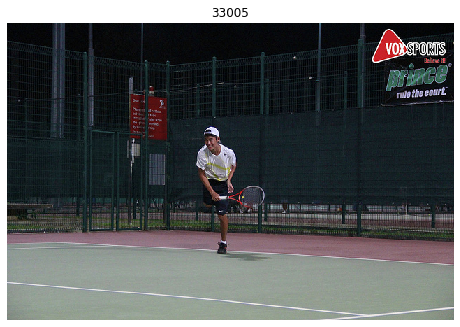

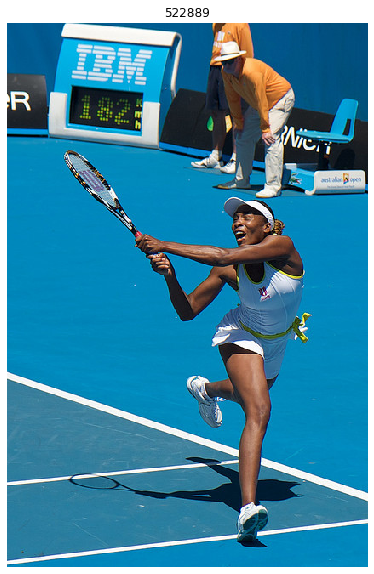

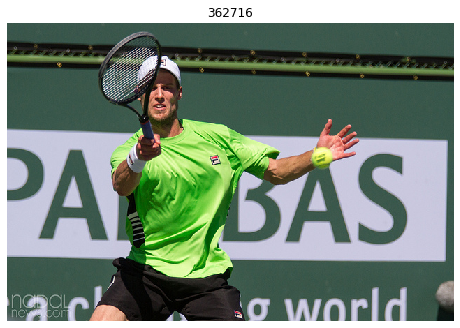

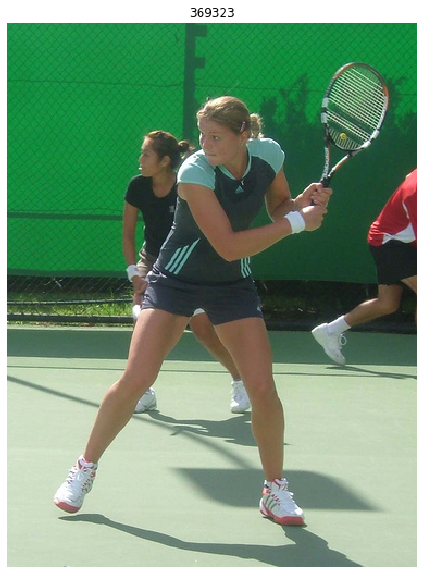

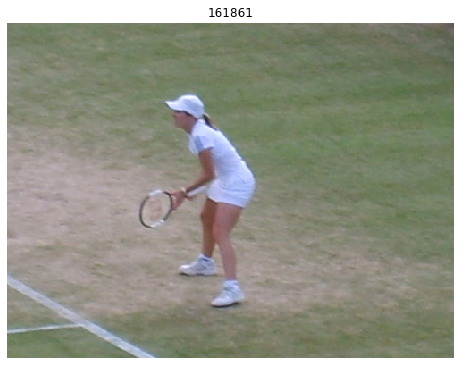

In [120]:
imgIds =[397279, 885, 33005, 522889, 362716, 369323, 161861]

# tennis
for imgId in imgIds:
    img = coco.loadImgs(imgId)[0]
    I = io.imread(img['coco_url'])
    plt.axis('off')
    plt.imshow(I)
    plt.title(str(imgId))
    plt.show()

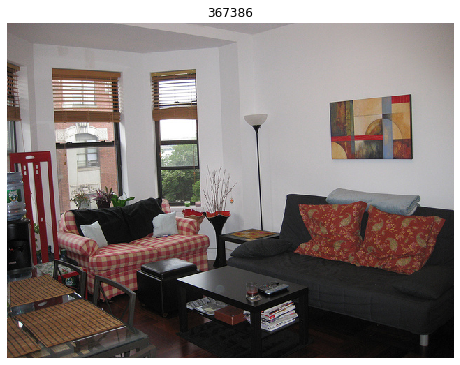

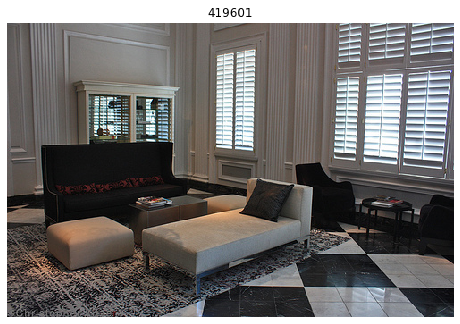

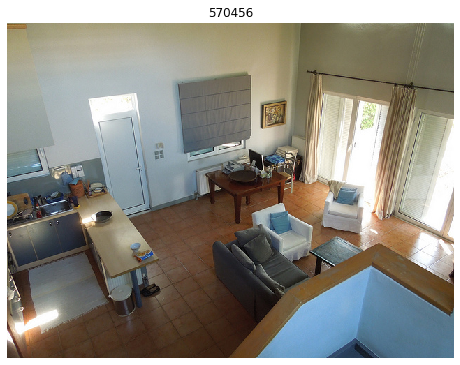

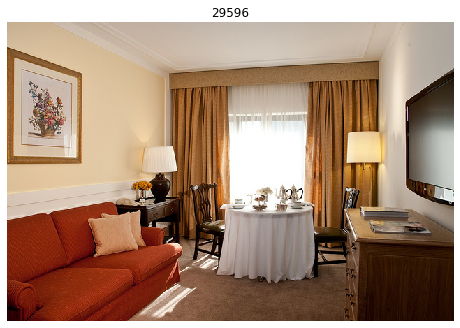

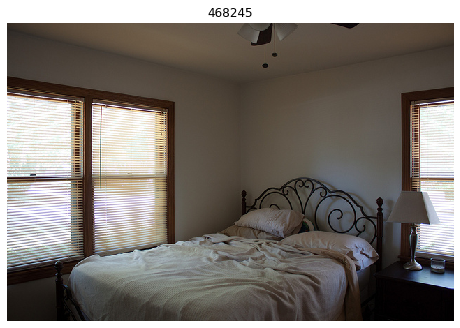

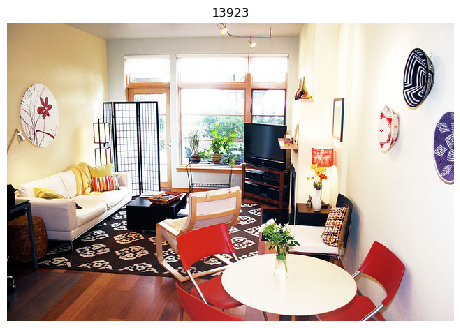

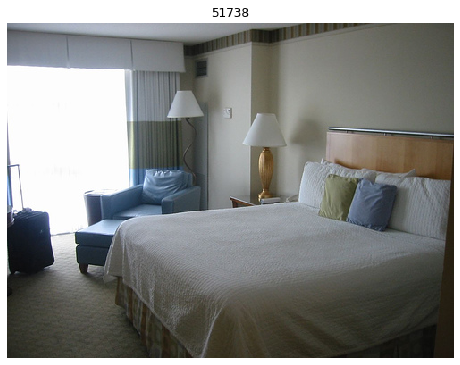

In [121]:
imgIds =[367386, 419601, 570456, 29596, 468245, 13923, 51738]

# home interior
for imgId in imgIds:
    img = coco.loadImgs(imgId)[0]
    I = io.imread(img['coco_url'])
    plt.axis('off')
    plt.imshow(I)
    plt.title(str(imgId))
    plt.show()

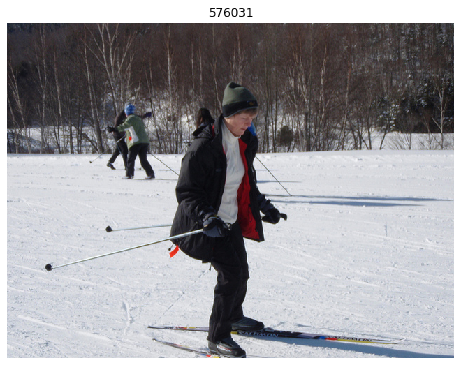

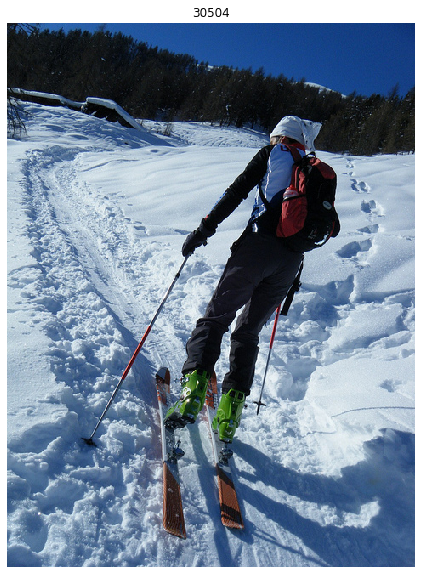

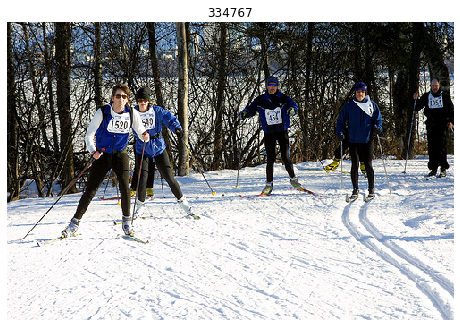

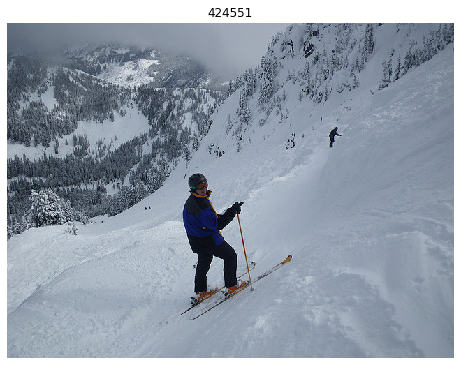

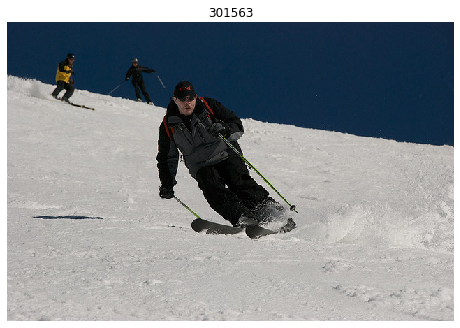

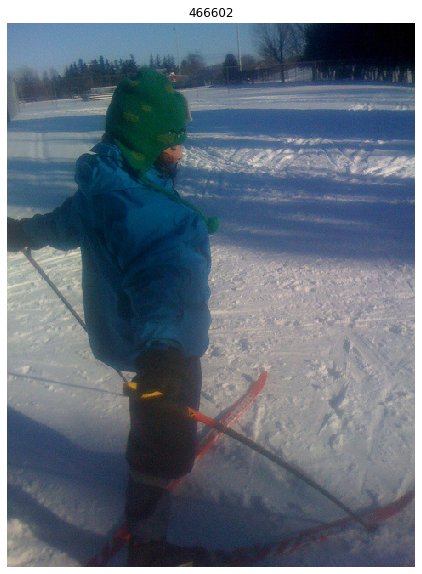

In [122]:
# skiing
imgIds =[576031, 30504, 334767, 424551, 301563, 466602]

for imgId in imgIds:
    img = coco.loadImgs(imgId)[0]
    I = io.imread(img['coco_url'])
    plt.axis('off')
    plt.imshow(I)
    plt.title(str(imgId))
    plt.show()

# Soft Clustering using GMM

In [29]:
import sklearn
import numpy as np
from sklearn import mixture

# Select best model based on the minimization of the Bayesian Information Criterion (BIC)

best_gmm = None
best_config = None
lowest_bic = np.infty
bic_dict = {}

cv_types = ['spherical', 'tied', 'diag', 'full']
n_components_range = range(10, 51, 5)

g_dict = {}

for n_components in tqdm(n_components_range):
    for cv_type in tqdm(cv_types):
        try:
            gmm = mixture.GaussianMixture(n_components=n_components, 
                                        covariance_type=cv_type,
                                        random_state=46)
            gmm.fit(X)
            bic_score = gmm.bic(X)
            bic_dict[(n_components, cv_type)] = bic_score
            if bic_score < lowest_bic:
                lowest_bic = bic_score
                best_gmm = gmm
                best_config = (n_components, cv_type)
        except Exception as e:
            print(e)

Fitting the mixture model failed because some components have ill-defined empirical covariance (for instance caused by singleton or collapsed samples). Try to decrease the number of components, or increase reg_covar.



Fitting the mixture model failed because some components have ill-defined empirical covariance (for instance caused by singleton or collapsed samples). Try to decrease the number of components, or increase reg_covar.



Fitting the mixture model failed because some components have ill-defined empirical covariance (for instance caused by singleton or collapsed samples). Try to decrease the number of components, or increase reg_covar.



Fitting the mixture model failed because some components have ill-defined empirical covariance (for instance caused by singleton or collapsed samples). Try to decrease the number of components, or increase reg_covar.



Fitting the mixture model failed because some components have ill-defined empirical covariance (for instance caused by singleton or collapsed samples). Try to decrease the number of components, or increase reg_covar.



Fitting the mixture model failed because some components have ill-defined empirical covariance (for instance caused by singleton or collapsed samples). Try to decrease the number of components, or increase reg_covar.




In [32]:
best_gmm,best_config,lowest_bic 

(GaussianMixture(covariance_type='diag', init_params='kmeans', max_iter=100,
                 means_init=None, n_components=20, n_init=1,
                 precisions_init=None, random_state=46, reg_covar=1e-06,
                 tol=0.001, verbose=0, verbose_interval=10, warm_start=False,
                 weights_init=None), (20, 'diag'), 18765818.919934236)

In [41]:
gmm_models_bic = pd.DataFrame([(bic, config[0], config[1]) for config, bic in bic_dict.items()], 
             columns=['bic', 'n_components', 'cv_type'])

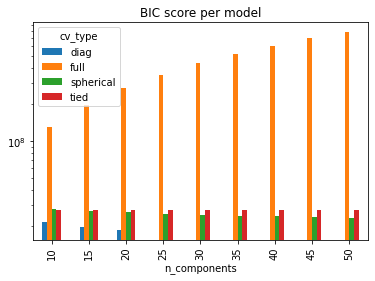

In [43]:
# Plot the BIC scores
import pandas as pd

gmm_models_bic = pd.DataFrame([(bic, config[0], config[1]) for config, bic in bic_dict.items()], 
             columns=['bic', 'n_components', 'cv_type'])
gmm_models_bic.pivot('n_components', 'cv_type', 'bic').plot(kind='bar',  title='BIC score per model')
plt.yscale("log")
plt.show()

In [44]:
X_probs = best_gmm.predict_proba(X)
X_clusters = best_gmm.predict(X)

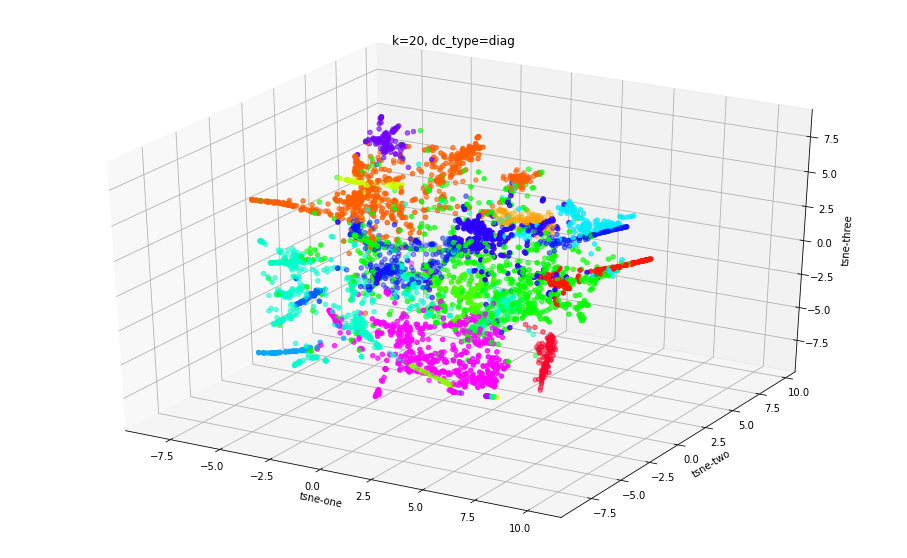

In [45]:
print_tsne_3d(X_tsne, X_clusters, title=f'k={best_config[0]}, dc_type={best_config[1]}')

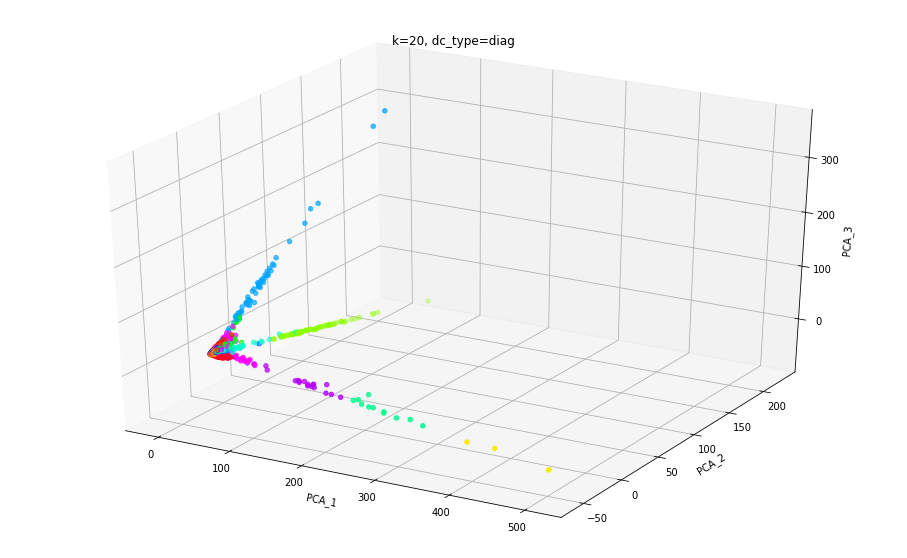

In [53]:
print_3d(X_pca, X_clusters, title=f'k={best_config[0]}, dc_type={best_config[1]}', columns=['PCA_1', 'PCA_2', 'PCA_3'])